# Análisis Estadístico NFL (National Football League)

La NFL es la liga de futbol américano de los Estados Unidos y uno de los deportes mas populares en dicho país. Como aficionado he seguido la NFL desde el año 2000 y quiero aprovechar esta actividad para a partir de la carga y transformación de algunos datasets con información relevante sobre equipos, partidos y jugadas, responder algunas de las preguntas que me hago en cada temporada:

- Cuáles son los equipos que mas ganan de local o de visitante?
- Cuál es el mariscal de campo (QB) con mejor incide de anotaciones vs intersecciones?
- Cuáles son los equipos con mejor promedio de anotaciones?
- El viento y la temperatura influyen en el juego de pase, las intercepciones y los goles de campo?
- Y muchas otras mas...

## Tabla de contenidos
1. [Fuente de los datasets y temporadas a evaluar](#dataset-sources)

    1.1 [Teams](#teams-dataset)

    1.2 [Standings](#standings-dataset)

    1.3 [Games](#games-dataset)
    
    1.4 [Combinando Teams con Games y Standings](#datasets-merge)<br/><br/>

2. [Diferencial de partidos ganados y perdidos de la temporada anterior](#win-losses-dif)<br/><br/>
3. [Mejor equipo como local](#best-home-team)<br/><br/>
4. [Mejor equipo como visitante](#best-away-team)<br/><br/>
5. [Gráfica comparativa entre partidos ganados de local y partidos ganados como visitante](#away-home-wins)<br/><br/>
6. [Estadio donde mas ganan los visitantes](#stadium-losses)<br/><br/>
7. [Análisis de apuestas en temporada regular](#bets-by-season)<br/><br/>
8. [Análisis de apuestas en partidos con equipos de la misma división](#bets-by-division)<br/><br/>
9. [Análisis de apuestas en postemporada](#bets-by-postseason)<br/><br/>
10. [Equipos con mas triunfos contra equipos con marca ganadora la temporada anterior](#hard-calendar-wins)<br/><br/>
    10.1 [Gráfica por division del último año](#hard-calendar-wins-chart)<br/><br/>
11. [Equipos con mejor marca ganadora de la decada por conferencia](#best-winner-record-by-conf)<br/><br/>
12. [Equipos con mas juegos de playoffs de la decada](#more-playoff-games)<br/><br/>
13. [Mejor ofensiva de la década](#best-offensive)<br/><br/>
14. [Peor ofensiva de la década](#worst-offensive)<br/><br/>
15. [Mejor defensiva de la década](#best-defensive)<br/><br/>
16. [Peor defensiva de la década](#worst-defensive)<br/><br/>
17. [Dataset de jugada a jugada por partido](#dataset-play-by-play)<br/><br/>
18. [Análisis de conversiones de dos puntos](#two-points-convertion)<br/><br/>
19. [Relación de pases y corridas por temporada](#pass-rush-relationship)<br/><br/>
20. [QB con mejor indice de touchdowns/intersecciones por temporada](#qb-best-index)<br/><br/>
21. [Análisis de correlaciones](#correlations)<br/><br/>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [3]:
# datasets files
teams_dataset_file = os.path.join("datasets", "teams.csv")
standings_dataset_file = os.path.join("datasets" ,"standings.csv")
games_dataset_file = os.path.join("datasets", "games.csv")

# seasons to evaluate
seasons_to_evaluate = [2011,2012,2013,2014,2015,2016,2017,2018,2019,2020]

<a name="dataset-sources"></a>
## Datasets a Utilizar

Explorando en internet encontré la colección [**nflverse**](https://github.com/nflverse), la cual contiene diferentes repositorios de datos y algunas librerias diseñadas para realizar análisis estadístico de la NFL.

### Datasets (Tomados del repositorio [nfldata](https://github.com/nflverse/nfldata)):
- **teams.csv**: Contiene la información general de los equipos de la nfl por temporada.
- **standings.csv**: Contiene la posicion final de cada equipo en su conferencia/division por temporada
- **games.csv**: Contiene el resultado de todos los partidos por temporada, asi como información de apuestas, head coaches y QBs.

Dichos datasets incluyen información desde la temporada 2000 pero para efectos de la presente actividad, vamos a trabajar con información de la última decada, es decir las últimas 10 temporadas (De 2011 a 2020).

In [7]:
# read teams dataset
teams = pd.read_csv(teams_dataset_file)
display(teams.sample(10))

,season,team,nfl,nfl_team_id,espn,pfr,pff,pfflabel,fo,full,location,short_location,nickname,hyphenated,sbr,sbr_wins,sbr_name,draft_kings
374,2013,OAK,OAK,2520,OAK,RAI,23.0,OAK,OAK,Oakland Raiders,Oakland,Oakland,Raiders,oakland-raiders,1533,NaN,NaN,NaN
561,2019,LA,LA,2510,LAR,RAM,26.0,LA,LAR,Los Angeles Rams,Los Angeles Rams,LA Rams,Rams,los-angeles-rams,1550,NaN,NaN,NaN
540,2018,SF,SF,4500,SF,SFO,28.0,SF,SF,San Francisco 49ers,San Francisco,San Francisco,49ers,san-francisco-49ers,1547,NaN,NaN,NaN
33,2003,ATL,ATL,200,ATL,ATL,NaN,NaN,ATL,Atlanta Falcons,Atlanta,Atlanta,Falcons,atlanta-falcons,1546,NaN,NaN,NaN
534,2018,NYG,NYG,3410,NYG,NYG,21.0,NYG,NYG,New York Giants,New York Giants,NY Giants,Giants,new-york-giants,1535,NaN,NaN,NaN
639,2021,WAS,WAS,5110,WSH,WAS,32.0,WAS,WAS,Washington Football Team,Washington,Washington,Football Team,washington-football-team,1537,NaN,Washington Football Team,WAS Football Team
432,2015,MIA,MIA,2700,MIA,MIA,17.0,MIA,MIA,Miami Dolphins,Miami,Miami,Dolphins,miami-dolphins,1524,NaN,NaN,NaN
298,2011,DET,DET,1540,DET,DET,11.0,DET,DET,Detroit Lions,Detroit,Detroit,Lions,detroit-lions,1539,NaN,NaN,NaN
190,2007,TEN,TEN,2100,TEN,OTI,31.0,TEN,TEN,Tennessee Titans,Tennessee,Tennessee,Titans,tennessee-titans,1528,NaN,NaN,NaN
133,2006,CHI,CHI,810,CHI,CHI,6.0,CHI,CHI,Chicago Bears,Chicago,Chicago,Bears,chicago-bears,1540,NaN,NaN,NaN


In [8]:
# removing irrelevant columns
teams.drop(["nfl", "nfl_team_id", "espn", "pfr", "pff", "pfflabel", "fo", "location", "short_location", "nickname", "hyphenated", "sbr", "sbr_wins", "sbr_name", "draft_kings"]
    , axis=1
    , inplace=True)
display(teams.sample(10))

,season,team,full
446,2015,TEN,Tennessee Titans
292,2011,CAR,Carolina Panthers
113,2005,MIN,Minnesota Vikings
331,2012,GB,Green Bay Packers
192,2008,ARI,Arizona Cardinals
62,2003,TEN,Tennessee Titans
537,2018,PHI,Philadelphia Eagles
425,2015,DEN,Denver Broncos
637,2021,TB,Tampa Bay Buccaneers
43,2003,GB,Green Bay Packers


<a name="teams-dataset"></a>
## Teams Dataset:
- **season**: La temporada del equipo. Este campo permite identificar el nombre de cada equipo por temporada, aunque los equipos han sido básicamente los mismos durante los años a evaluar, si se han presentado traslados de equipos a otras ciudades lo que ha implicado cambios en sus nombres.
- **team**: Código o nombre corto del equipo
- **full**(renombrado a team_name): Nombre completo del equipo

Para fácilitar el proceso, vamos a filtrar el dataset de teams para usar solo los equipos de la última temporada (2020) y definiremos en un diccionario los cambios de nombre de los equipos que se han trasladado de ciudad para homolagar los demas datasets.

In [73]:
# keep 2020 season records and set index on team short name
teams = teams[teams["season"] == 2020]
teams.set_index("team", inplace=True)
teams.drop("season", axis=1, inplace=True)
teams.rename(columns={"full" : "team_name"}, inplace=True)
display(teams)

,team_name
team,
ARI,Arizona Cardinals
ATL,Atlanta Falcons
BAL,Baltimore Ravens
BUF,Buffalo Bills
CAR,Carolina Panthers
CHI,Chicago Bears
CIN,Cincinnati Bengals
CLE,Cleveland Browns
DAL,Dallas Cowboys


In [74]:
# dictionaries for relocated teams: {"PREV_TEAM_ID" : "NEW_TEAM_ID"}
relocated_teams = {"OAK" : "LV", "SD" : "LAC", "STL" : "LA"}

# generic function to replace relocated team ids
def replace_relocated_teams(target_data_frame, column_name, relocated_teams):
    for prev_team_id, new_team_id in relocated_teams.items():
        target_data_frame.loc[target_data_frame[column_name] == prev_team_id, column_name] = new_team_id

In [75]:
# read standings dataset
all_standings = pd.read_csv(standings_dataset_file)
display(all_standings.sample(10))

,season,conf,division,team,wins,losses,ties,pct,div_rank,scored,allowed,net,sov,sos,seed,playoff
601,2020,NFC,NFC South,CAR,5,11,0,0.3125,3,350,402,-52,0.387500,0.531250,NaN,NaN
481,2017,AFC,AFC East,MIA,6,10,0,0.3750,3,281,393,-112,0.531250,0.542969,NaN,NaN
293,2011,AFC,AFC North,CIN,9,7,0,0.5625,3,344,323,21,0.326389,0.492188,6.0,LostWC
205,2008,AFC,AFC West,KC,2,14,0,0.1250,4,291,440,-149,0.406250,0.535156,NaN,NaN
275,2010,NFC,NFC East,WAS,6,10,0,0.3750,4,302,377,-75,0.531250,0.515625,NaN,NaN
238,2009,AFC,AFC West,OAK,5,11,0,0.3125,3,197,379,-182,0.525000,0.527344,NaN,NaN
432,2015,NFC,NFC East,DAL,4,12,0,0.2500,4,275,374,-99,0.437500,0.531250,NaN,NaN
42,2003,AFC,AFC South,JAX,5,11,0,0.3125,3,276,331,-55,0.450000,0.542969,NaN,NaN
464,2016,NFC,NFC East,DAL,13,3,0,0.8125,1,421,306,115,0.439904,0.470703,1.0,LostDV
545,2019,AFC,AFC East,MIA,5,11,0,0.3125,4,306,494,-188,0.462500,0.484375,NaN,NaN


In [76]:
# removing irrelevant columns
all_standings.drop(["sov", "sos"]
    , axis=1
    , inplace=True)
display(all_standings.sample(10))
print(all_standings.shape)

,season,conf,division,team,wins,losses,ties,pct,div_rank,scored,allowed,net,seed,playoff
347,2012,NFC,NFC South,TB,7,9,0,0.4375,4,389,394,-5,NaN,NaN
172,2007,AFC,AFC West,DEN,7,9,0,0.4375,2,320,409,-89,NaN,NaN
167,2007,AFC,AFC North,PIT,10,6,0,0.6250,1,393,269,124,4.0,LostWC
494,2017,AFC,AFC West,LAC,9,7,0,0.5625,2,355,272,83,NaN,NaN
536,2018,NFC,NFC South,ATL,7,9,0,0.4375,2,414,423,-9,NaN,NaN
497,2017,NFC,NFC East,NYG,3,13,0,0.1875,4,246,388,-142,NaN,NaN
229,2009,AFC,AFC North,CIN,10,6,0,0.6250,1,305,291,14,4.0,LostWC
45,2003,AFC,AFC West,KC,13,3,0,0.8125,1,484,332,152,2.0,LostDV
2,2002,AFC,AFC East,NE,9,7,0,0.5625,2,381,346,35,NaN,NaN
315,2011,NFC,NFC South,TB,4,12,0,0.2500,4,287,494,-207,NaN,NaN


(640, 14)


<a name="standings-dataset"></a>
## Standings Dataset:
- **season**: Temporada o año
- **conf**: Conferencia a la que pertenece el equipo
- **division**: Division a la que pertenece el equipo
- **team**: Código del equipo
- **wins**: Cantidad de partidos ganados en la temporada regular
- **losses**: Cantidad de partidos perdidos en la temporada regular
- **ties**: Cantidad de partidos empatados en la temporada regular
- **pct**: Porcentaje de triunfos en la temporada regular
- **div_rank**: Posición del equipo en la división
- **scored**: Cantidad de puntos anotados en la temporada regular
- **allowed**: Cantidad de puntos recibidos en la temporada regular
- **net**: Diferencia entre puntos anotados y recibidos en la temporada regular
- **seed**: Posición del equipo en caso de clasificar a postemporada
- **playoff**: Resultado final obtenido en postemporada

Luego de cargar el dataset y remover las columnas no relevantes, se precede a homologar la información de los equipos que se trasladaron y a eliminar registros de las temporadas que no se van a evaluar.

In [77]:
# replace old team ids
replace_relocated_teams(all_standings, "team", relocated_teams)
# filter seasons to evaluate in a new dataframe
standings = all_standings.drop(all_standings[~all_standings["season"].isin(seasons_to_evaluate)].index)
display(standings)
print(standings.shape)

,season,conf,division,team,wins,losses,ties,pct,div_rank,scored,allowed,net,seed,playoff
288,2011,AFC,AFC East,BUF,6,10,0,0.3750,4,372,434,-62,NaN,NaN
289,2011,AFC,AFC East,MIA,6,10,0,0.3750,3,329,313,16,NaN,NaN
290,2011,AFC,AFC East,NE,13,3,0,0.8125,1,513,342,171,1.0,LostSB
291,2011,AFC,AFC East,NYJ,8,8,0,0.5000,2,377,363,14,NaN,NaN
292,2011,AFC,AFC North,BAL,12,4,0,0.7500,1,378,266,112,2.0,LostCC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603,2020,NFC,NFC South,TB,11,5,0,0.6875,2,492,355,137,5.0,WonSB
604,2020,NFC,NFC West,ARI,8,8,0,0.5000,3,410,367,43,NaN,NaN
605,2020,NFC,NFC West,LA,10,6,0,0.6250,2,372,296,76,6.0,LostDV
606,2020,NFC,NFC West,SEA,12,4,0,0.7500,1,459,371,88,3.0,LostWC


(320, 14)


In [78]:
# read games dataset
games = pd.read_csv(games_dataset_file)
display(games.sample(10))

,game_id,season,game_type,week,gameday,weekday,gametime,away_team,away_score,home_team,...,wind,away_qb_id,home_qb_id,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium_id,stadium
613,2001_07_OAK_PHI,2001,REG,7,2001-10-28,Sunday,16:15,OAK,20.0,PHI,...,17.0,00-0005741,00-0011022,Rich Gannon,Donovan McNabb,Jon Gruden,Andy Reid,Tom White,PHI99,Veterans Stadium
4449,2015_14_BUF_PHI,2015,REG,14,2015-12-13,Sunday,13:00,BUF,20.0,PHI,...,3.0,00-0028118,00-0027854,Tyrod Taylor,Sam Bradford,Rex Ryan,Chip Kelly,Ed Hochuli,PHI00,Lincoln Financial Field
4684,2016_12_SD_HOU,2016,REG,12,2016-11-27,Sunday,13:00,SD,21.0,HOU,...,NaN,00-0022942,00-0029682,Philip Rivers,Brock Osweiler,Mike McCoy,Bill O'Brien,Jeff Triplette,HOU00,NRG Stadium
1836,2005_18_CAR_NYG,2005,WC,18,2006-01-08,Sunday,13:00,CAR,23.0,NYG,...,6.0,00-0004161,00-0022803,Jake Delhomme,Eli Manning,John Fox,Tom Coughlin,Bill Leavy,NYC00,Giants Stadium
5067,2018_02_LAC_BUF,2018,REG,2,2018-09-16,Sunday,13:00,LAC,31.0,BUF,...,6.0,00-0022942,00-0034857,Philip Rivers,Josh Allen,Anthony Lynn,Sean McDermott,Clay Martin,BUF00,New Era Field
5650,2020_05_LV_KC,2020,REG,5,2020-10-11,Sunday,13:00,LV,40.0,KC,...,16.0,00-0031280,00-0033873,Derek Carr,Patrick Mahomes,Jon Gruden,Andy Reid,Clete Blakeman,KAN00,Arrowhead Stadium
3107,2010_14_ATL_CAR,2010,REG,14,2010-12-12,Sunday,13:00,ATL,31.0,CAR,...,14.0,00-0026143,00-0027659,Matt Ryan,Jimmy Clausen,Mike Smith,John Fox,Clete Blakeman,CAR00,Bank of America Stadium
5562,2019_17_MIA_NE,2019,REG,17,2019-12-29,Sunday,13:00,MIA,27.0,NE,...,2.0,00-0023682,00-0019596,Ryan Fitzpatrick,Tom Brady,Brian Flores,Bill Belichick,Clay Martin,BOS00,Gillette Stadium
2635,2008_18_ATL_ARI,2008,WC,18,2009-01-03,Saturday,16:30,ATL,24.0,ARI,...,NaN,00-0026143,00-0017200,Matt Ryan,Kurt Warner,Mike Smith,Ken Whisenhunt,John Parry,PHO00,University of Phoenix Stadium
5121,2018_05_OAK_LAC,2018,REG,5,2018-10-07,Sunday,16:05,OAK,10.0,LAC,...,10.0,00-0031280,00-0022942,Derek Carr,Philip Rivers,Jon Gruden,Anthony Lynn,Alex Kemp,LAX97,StubHub Center


In [79]:
# removing irrelevant columns
games.drop(["total"
        , "old_game_id"
        , "espn"
        , "away_rest"
        , "week"
        , "gameday"
        , "weekday"
        , "gametime"
        , "location"
        , "home_rest"
        , "away_moneyline"
        , "home_moneyline"
        , "away_spread_odds"
        , "home_spread_odds"
        , "total_line"
        , "under_odds"
        , "over_odds"
        , "away_qb_id"
        , "home_qb_id"
        , "stadium_id"]
    , axis=1
    , inplace=True)
display(games.sample(10))
print(games.shape)

,game_id,season,game_type,away_team,away_score,home_team,home_score,result,overtime,spread_line,...,roof,surface,temp,wind,away_qb_name,home_qb_name,away_coach,home_coach,referee,stadium
4680,2016_12_CIN_BAL,2016,REG,CIN,14.0,BAL,19.0,5.0,0.0,3.5,...,outdoors,grass,50.0,12.0,Andy Dalton,Joe Flacco,Marvin Lewis,John Harbaugh,Clete Blakeman,M&T Bank Stadium
5949,2021_07_ATL_MIA,2021,REG,ATL,NaN,MIA,NaN,NaN,NaN,3.5,...,outdoors,grass,NaN,NaN,NaN,NaN,Arthur Smith,Brian Flores,NaN,Hard Rock Stadium
1532,2004_15_TEN_OAK,2004,REG,TEN,35.0,OAK,40.0,5.0,0.0,3.5,...,outdoors,grass,54.0,6.0,Billy Volek,Kerry Collins,Jeff Fisher,Norv Turner,Bill Leavy,McAfee Coliseum
4963,2017_13_TB_GB,2017,REG,TB,20.0,GB,26.0,6.0,1.0,3.0,...,outdoors,grass,42.0,8.0,Jameis Winston,Brett Hundley,Dirk Koetter,Mike McCarthy,Terry McAulay,Lambeau Field
2031,2006_13_JAX_MIA,2006,REG,JAX,24.0,MIA,10.0,-14.0,0.0,1.0,...,outdoors,grass,81.0,11.0,David Garrard,Joey Harrington,Jack Del Rio,Nick Saban,Bill Vinovich,Dolphin Stadium
2720,2009_05_IND_TEN,2009,REG,IND,31.0,TEN,9.0,-22.0,0.0,-3.0,...,outdoors,grass,57.0,4.0,Peyton Manning,Kerry Collins,Jim Caldwell,Jeff Fisher,Walt Anderson,LP Field
2831,2009_13_OAK_PIT,2009,REG,OAK,27.0,PIT,24.0,-3.0,0.0,14.5,...,outdoors,dessograss,28.0,6.0,Bruce Gradkowski,Ben Roethlisberger,Tom Cable,Mike Tomlin,Jerome Boger,Heinz Field
4165,2014_13_CAR_MIN,2014,REG,CAR,13.0,MIN,31.0,18.0,0.0,2.5,...,outdoors,fieldturf,12.0,17.0,Cam Newton,Teddy Bridgewater,Ron Rivera,Mike Zimmer,Brad Allen,TCF Bank Stadium
4819,2017_03_TB_MIN,2017,REG,TB,17.0,MIN,34.0,17.0,0.0,-0.0,...,dome,sportturf,NaN,NaN,Jameis Winston,Case Keenum,Dirk Koetter,Mike Zimmer,John Hussey,U.S. Bank Stadium
1981,2006_10_WAS_PHI,2006,REG,WAS,3.0,PHI,27.0,24.0,0.0,9.0,...,outdoors,grass,61.0,14.0,Mark Brunell,Donovan McNabb,Joe Gibbs,Andy Reid,Ron Winter,Lincoln Financial Field


(6124, 21)


<a name="games-dataset"></a>
## Games Dataset:
- **game_id**: Identificador único del juego (año_semana_visitante_local)
- **season**: Temporada o año
- **game_type**: Partido de temporada regular o postemporada
- **away_team**: Código del equipo visitante
- **away_score**: Puntos obtenidos por el equipo visitante
- **home_team**: Código del equipo local
- **home_score**: Puntos obtenidos por el equipo local
- **result**: Diferencia entre los puntos obtenidos por el equipo local y los puntos obtenidos por el visitante.  Un número mayor a 0 significa que el equipo local ganó
- **spread_line**: Relacionado con las apuestas, hace referencia a la diferencia de puntos que obtendrá el equipo favorito para el partido. Un número mayor a 0 significa que el equipo local es el favorito por n puntos
- **div_game**: Define si es un partido con equipos de la misma división
- **roof**: Define el tipo de estadio
- **surface**: Superficie del campo de juego
- **temp**: Temperatura promedio durante el partido
- **wind**: Velocidad del viento promedio durante el partido
- **away_qb_name**: Nombre del QB visitante
- **home_qb_name**: Nombre del QB local
- **away_coach**: Nombre del HC visitante
- **home_coach**: Nombre del HC local
- **referee**: Arbitro del partido
- **stadium**: Nombre del estadio

Luego de cargar el dataset y remover las columnas no relevantes, se precede a homologar la información de los equipos que se trasladaron y a eliminar registros de las temporadas que no se van a evaluar.

In [80]:
# replace old team ids
replace_relocated_teams(games, "away_team", relocated_teams)
replace_relocated_teams(games, "home_team", relocated_teams)
# filter seasons to evaluate
games.drop(games[~games["season"].isin(seasons_to_evaluate)].index, inplace=True)
print(games.shape)

(2672, 21)


<a name="datasets-merge"></a>
## Combinando Teams con Games y Standings

Se realiza un merge entre **games** y **teams** con el objetivo de incluir los nombres completos de los equipos local y visitante en el dataset principal de games.

De igual forma se realiza un merge entre **standings** y **teams** para incluir el nombre completo de cada equipo.

In [81]:
# merge join with teams dataframe for team names
games = games.merge(teams, left_on="away_team", right_index=True, how="inner")
games.rename(columns={"team_name" : "away_team_name"}, inplace=True)

games = games.merge(teams, left_on="home_team", right_index=True, how="inner")
games.rename(columns={"team_name" : "home_team_name"}, inplace=True)

standings = standings.merge(teams, left_on="team", right_index=True, how="inner")

<a name="win-losses-diff"></a>
## Diferencial de partidos ganados y perdidos de la temporada anterior

Con el objetivo de robustecer el dataset de **games** para posteriores análisis, generamos las siguientes columnas a partir del dataset **standings**:

- **away_wins_losses_dif**: Diferencia entre partidos ganados y perdidos por el equipo visitante en la temporada anterior
- **away_team_conf**: Conferencia a la que pertence el equipo visitante
- **away_team_div**: División a la que pertenecen el equipo visitante
- **home_wins_losses_dif**: Diferencia entre partidos ganados y perdidos por el equipo local en la temporada anterior
- **home_team_conf**: Conferencia a la que pertence el equipo local
- **home_team_div**: División a la que pertenecen el equipo local


In [82]:
games["previous_season"] = games["season"] - 1
all_standings["wins_losses_dif"] = all_standings["wins"] - all_standings["losses"]

standings_to_merge = all_standings[["season", "team", "wins_losses_dif", "conf", "division"]].copy()
standings_to_merge.rename(columns={"season" : "previous_season"}, inplace=True)

# merge games with standings to include away team info
games = games.merge(standings_to_merge, left_on=["away_team", "previous_season"], right_on=["team", "previous_season"], how="inner")
games.drop("team", axis=1, inplace=True)
games.rename(columns={"wins_losses_dif" : "away_wins_losses_dif", "conf" : "away_team_conf", "division" : "away_team_div"}, inplace=True)

# merge games with standings to include home team info
games = games.merge(standings_to_merge, left_on=["home_team", "previous_season"], right_on=["team", "previous_season"], how="inner")
games.drop("team", axis=1, inplace=True)
games.rename(columns={"wins_losses_dif" : "home_wins_losses_dif", "conf" : "home_team_conf", "division" : "home_team_div"}, inplace=True)

#Change games index
games.set_index("game_id", inplace=True)
display(games.sample(10))

,season,game_type,away_team,away_score,home_team,home_score,result,overtime,spread_line,div_game,...,stadium,away_team_name,home_team_name,previous_season,away_wins_losses_dif,away_team_conf,away_team_div,home_wins_losses_dif,home_team_conf,home_team_div
game_id,,,,,,,,,,,,,,,,,,,,,
2017_06_CHI_BAL,2017,REG,CHI,27.0,BAL,24.0,-3.0,1.0,5.5,0,...,M&T Bank Stadium,Chicago Bears,Baltimore Ravens,2016,-10,NFC,NFC North,0,AFC,AFC North
2015_17_PIT_CLE,2015,REG,PIT,28.0,CLE,12.0,-16.0,0.0,-13.0,1,...,FirstEnergy Stadium,Pittsburgh Steelers,Cleveland Browns,2014,6,AFC,AFC North,-2,AFC,AFC North
2013_02_DEN_NYG,2013,REG,DEN,41.0,NYG,23.0,-18.0,0.0,-3.5,0,...,MetLife Stadium,Denver Broncos,New York Giants,2012,10,AFC,AFC West,2,NFC,NFC East
2019_02_LAC_DET,2019,REG,LAC,10.0,DET,13.0,3.0,0.0,-1.0,0,...,Ford Field,Los Angeles Chargers,Detroit Lions,2018,8,AFC,AFC West,-4,NFC,NFC North
2013_05_SEA_IND,2013,REG,SEA,28.0,IND,34.0,6.0,0.0,-3.0,0,...,Lucas Oil Stadium,Seattle Seahawks,Indianapolis Colts,2012,6,NFC,NFC West,6,AFC,AFC South
2016_02_NO_NYG,2016,REG,NO,13.0,NYG,16.0,3.0,0.0,3.5,0,...,MetLife Stadium,New Orleans Saints,New York Giants,2015,-2,NFC,NFC South,-4,NFC,NFC East
2012_17_BAL_CIN,2012,REG,BAL,17.0,CIN,23.0,6.0,0.0,5.5,1,...,Paul Brown Stadium,Baltimore Ravens,Cincinnati Bengals,2011,8,AFC,AFC North,2,AFC,AFC North
2013_12_IND_ARI,2013,REG,IND,11.0,ARI,40.0,29.0,0.0,3.5,0,...,University of Phoenix Stadium,Indianapolis Colts,Arizona Cardinals,2012,6,AFC,AFC South,-6,NFC,NFC West
2016_01_CIN_NYJ,2016,REG,CIN,23.0,NYJ,22.0,-1.0,0.0,1.0,0,...,MetLife Stadium,Cincinnati Bengals,New York Jets,2015,8,AFC,AFC North,4,AFC,AFC East


<a name="best-home-team"></a>
## Mejor equipo como local de la decada

A partir del dataset **games** generamos el top 5 de equipos con mas victorias como local en temporada regular

In [83]:
# filter games with result > 0 and group by team name
best_teams_at_home = games[(games["game_type"] == "REG") & (games["result"] > 0)][["home_team_name"]].copy()
best_teams_at_home = best_teams_at_home.groupby(by="home_team_name").agg({"home_team_name" : 'count'})
best_teams_at_home.columns = ["wins_at_home"]

display(best_teams_at_home.sort_values(by = 'wins_at_home', ascending = False).head(5))

,wins_at_home
home_team_name,
New England Patriots,66
Green Bay Packers,61
Seattle Seahawks,59
Pittsburgh Steelers,58
Baltimore Ravens,58


El mejor equipo en condición de local en las últimas 10 temporadas es **New England Patriots** con 66 victorias.

<a name="best-away-team"></a>
## Mejor equipo como visitante de la decada

A partir del dataset **games** generamos el top 5 de equipos con mas victorias como visitante en temporada regular

In [84]:
# filter games with result < 0 and group by team name
best_teams_as_visitors = games[(games["game_type"] == "REG") & (games["result"] < 0)][["away_team_name"]].copy()
best_teams_as_visitors = best_teams_as_visitors.groupby(by="away_team_name").agg({"away_team_name" : 'count'})
best_teams_as_visitors.columns = ["wins_as_visitor"]

display(best_teams_as_visitors.sort_values(by = 'wins_as_visitor', ascending = False).head(5))

,wins_as_visitor
away_team_name,
New England Patriots,52
Kansas City Chiefs,49
Seattle Seahawks,46
New Orleans Saints,45
Pittsburgh Steelers,44


En este caso **New England Patriots** tambien ha sido el equipo con mas victorias en condicion de visitantes, confirmando su dominio de la liga en la última decada. Tambien se pueden destacar los equipos **Seattle Seahawks** y **Pitsburgh Steelers** los cuales aparecen en ambos rankings.

<a name="away-home-wins"></a>
## Gráfica comparativa entre partidos ganados de local y partidos ganados como visitante

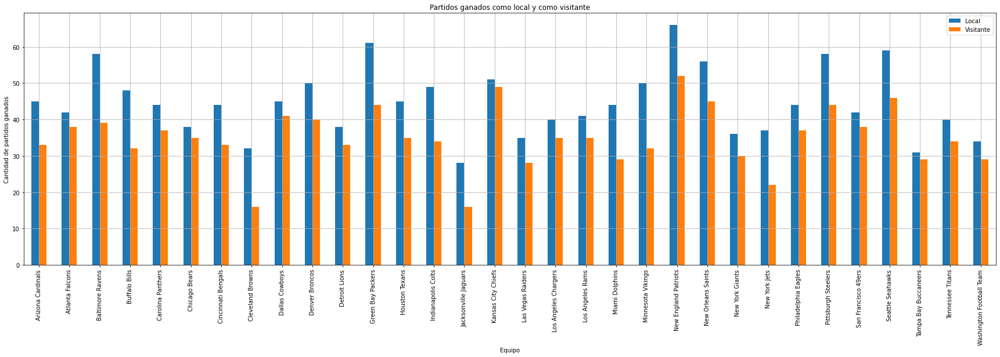

In [85]:
teams_with_home_and_visitor_wins = best_teams_at_home.merge(best_teams_as_visitors, left_index=True, right_index=True, how="inner")
teams_with_home_and_visitor_wins.columns = ["Local", "Visitante"]
teams_with_home_and_visitor_wins.plot.bar(figsize = (30,8)
    , grid = True
    , xlabel = "Equipo"
    , ylabel = "Cantidad de partidos ganados"
    , title = "Partidos ganados como local y como visitante")

plt.show()

En esta gráfica podemos confirmar los rankings previamente presentados y tambien podemos observer que el peor equipo de local es **Jacksonville Jaguars** el cual tambien es el peor visitante.

<a name="stadium-losses"></a>
## Estadio donde mas ganan los visitantes

Top 5 de estadios con mayor número de victorias por parte del equipo visitante en temporada regular

In [86]:
# filter games with result < 0 and group by stadium
games_won_by_visitors = games[(games["result"] < 0) & (games["game_type"] == "REG")][["stadium"]].copy()
games_won_by_visitors = games_won_by_visitors.groupby(by="stadium").agg({"stadium" : 'count'})
games_won_by_visitors.columns = ["lost_games"]
display(games_won_by_visitors.sort_values(by = "lost_games", ascending = False).head(5))

,lost_games
stadium,
MetLife Stadium,87
Raymond James Stadium,47
FedExField,46
Soldier Field,42
Ford Field,42


El estadio donde mas ganan los equipos visitantes es el **MetLife Stadium** de New York.  Cabe anotar que dicho estadio es compartido por los equipos **New York Jets** y **New York Giants**.  A continuación mostramos el la distribución de derrotas para estos equipos en dicho estadio:

In [87]:
# filter games with result < 0 and group by stadium
games_won_by_visitors = games[(games["result"] < 0) & (games["game_type"] == "REG") & (games["stadium"] == "MetLife Stadium")][["stadium", "home_team_name"]].copy()
games_won_by_visitors = games_won_by_visitors.groupby(by=["stadium", "home_team_name"]).agg({"stadium" : 'count'})
games_won_by_visitors.columns = ["lost_games"]
display(games_won_by_visitors)

lost_games
stadium         home_team_name             
MetLife Stadium New York Giants          44
                New York Jets            43

<a name="bets-by-season"></a>
## Análisis de apuestas en temporada regular

A continuación se realiza un análisis de cuantas veces el equipo favorito en las apuestas resulta siendo el ganador real del partido en partidos de temporada regular. Cabe anotar que la columna **spread_line** representa la diferencia de puntos predicha.

In [88]:
# function to resolve if bets favorite team won
def favorite_team_won(game_row):
    return 1 if (game_row["result"] > 0 and game_row["spread_line"] > 0) or (game_row["result"] < 0 and game_row["spread_line"] < 0) else 0

# function to calculate points difference between bets and final result
def calculate_points_difference(game_row):
    return abs(game_row["result"]) - abs(game_row["spread_line"]) if game_row["favorite_team_won"] == 1 else np.nan

# game bets in regular season
game_bets = games[games["game_type"] == "REG"][["season"
    , "home_team"
    , "home_score"
    , "away_team"
    , "away_score"
    , "result"
    , "spread_line"]].copy()

# new column to define if favorite team won
game_bets["favorite_team_won"] = game_bets.apply(favorite_team_won, axis=1)
# new column with points difference
game_bets["bet_points_difference"] = game_bets.apply(calculate_points_difference, axis=1)

bets_accuracy_by_season = game_bets.groupby(by="season").agg({"season" : "count", "favorite_team_won" : "sum", "bet_points_difference" : np.nanmean})
bets_accuracy_by_season.columns = ["total_games", "favorite_team_won", "points_difference_mean"]
bets_accuracy_by_season["percentage"] = round((bets_accuracy_by_season["favorite_team_won"] / bets_accuracy_by_season["total_games"]) * 100, 2)

display(bets_accuracy_by_season)
display(bets_accuracy_by_season.describe())

,total_games,favorite_team_won,points_difference_mean,percentage
season,,,,
2011,256,171,7.005848,66.80
2012,256,164,8.027439,64.06
2013,256,182,7.046703,71.09
2014,256,170,7.532353,66.41
2015,256,160,7.521875,62.50
2016,256,163,6.309816,63.67
2017,256,179,6.810056,69.92
2018,256,168,6.267857,65.62
2019,256,164,6.737805,64.06


,total_games,favorite_team_won,points_difference_mean,percentage
count,10.0,10.000000,10.000000,10.000000
mean,256.0,169.300000,6.833824,66.132000
std,0.0,7.071853,0.826430,2.762345
min,256.0,160.000000,5.078488,62.500000
25%,256.0,164.000000,6.416813,64.060000
50%,256.0,169.000000,6.907952,66.015000
75%,256.0,171.750000,7.403082,67.092500
max,256.0,182.000000,8.027439,71.090000


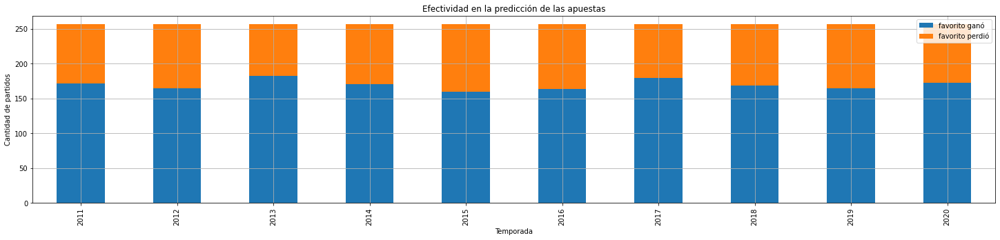

In [89]:
bets_accuracy_by_season["favorite_team_lost"] = bets_accuracy_by_season["total_games"] - bets_accuracy_by_season["favorite_team_won"]
bets_accuracy_by_season.columns = ["total partidos", "favorito ganó", "diferencia promedio puntos", "porcentaje", "favorito perdió"]
bets_accuracy_by_season[["favorito ganó", "favorito perdió"]].plot.bar(stacked=True
    , figsize = (25,5)
    , grid = True
    , xlabel = "Temporada"
    , ylabel = "Cantidad de partidos"
    , title = "Efectividad en la predicción de las apuestas")

plt.show()

Podemos percibir que en promedio que el favorito de las apuestas acierta un **66%** en los partidos de temporada regular con una diferencia promedio de 7 puntos (un touchdown) con respecto a la predicción inicial.

<a name="bets-by-division"></a>
## Análisis de apuestas en partidos con equipos de la misma división

In [90]:
# game bets with teams of the same division
game_bets = games[games["div_game"] == 1][["season"
    , "home_team"
    , "home_score"
    , "away_team"
    , "away_score"
    , "result"
    , "spread_line"]].copy()
    
# new column to define if favorite team won
game_bets["favorite_team_won"] = game_bets.apply(favorite_team_won, axis=1)
# new column with points difference
game_bets["bet_points_difference"] = game_bets.apply(calculate_points_difference, axis=1)

bets_accuracy_by_season = game_bets.groupby(by="season").agg({"season" : "count", "favorite_team_won" : "sum", "bet_points_difference" : np.nanmean})
bets_accuracy_by_season.columns = ["total_games", "favorite_team_won", "points_difference_mean"]
bets_accuracy_by_season["percentage"] = round((bets_accuracy_by_season["favorite_team_won"] / bets_accuracy_by_season["total_games"]) * 100, 2)

display(bets_accuracy_by_season)
display(bets_accuracy_by_season.describe())

,total_games,favorite_team_won,points_difference_mean,percentage
season,,,,
2011,96,64,6.812500,66.67
2012,97,66,7.303030,68.04
2013,98,74,5.148649,75.51
2014,97,67,7.246269,69.07
2015,97,55,8.009091,56.70
2016,96,62,4.959677,64.58
2017,97,74,6.493243,76.29
2018,97,65,5.861538,67.01
2019,96,67,6.231343,69.79


,total_games,favorite_team_won,points_difference_mean,percentage
count,10.000000,10.000000,10.000000,10.000000
mean,97.000000,66.100000,6.341609,68.134000
std,0.942809,5.506562,1.017911,5.492753
min,96.000000,55.000000,4.959677,56.700000
25%,96.250000,64.250000,5.478444,66.755000
50%,97.000000,66.500000,6.362293,67.860000
75%,97.000000,67.000000,7.137826,69.610000
max,99.000000,74.000000,8.009091,76.290000


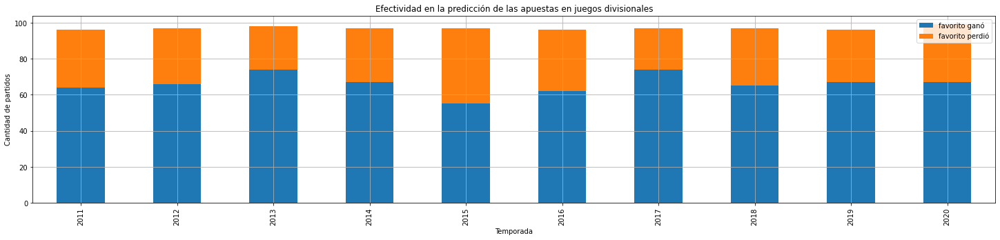

In [91]:
bets_accuracy_by_season["favorite_team_lost"] = bets_accuracy_by_season["total_games"] - bets_accuracy_by_season["favorite_team_won"]
bets_accuracy_by_season.columns = ["total partidos", "favorito ganó", "diferencia promedio puntos", "porcentaje", "favorito perdió"]
bets_accuracy_by_season[["favorito ganó", "favorito perdió"]].plot.bar(stacked=True
    , figsize = (25,5)
    , grid = True
    , xlabel = "Temporada"
    , ylabel = "Cantidad de partidos"
    , title = "Efectividad en la predicción de las apuestas en juegos divisionales")

plt.show()

Para los partidos divisionales el promedio en que el favorito de las apuestas acierta aumenta a un **68%** aunque la cantidad de aciertos no es muy consistente entre temporadas con una desviación de +/- 5.

<a name="bets-by-postseason"></a>
## Análisis de apuestas en postemporada

In [92]:
# game bets in postseason
game_bets = games[games["game_type"] != "REG"][["season"
    , "home_team"
    , "home_score"
    , "away_team"
    , "away_score"
    , "result"
    , "spread_line"]].copy()

# new column to define if favorite team won
game_bets["favorite_team_won"] = game_bets.apply(favorite_team_won, axis=1)
# new column with points difference
game_bets["bet_points_difference"] = game_bets.apply(calculate_points_difference, axis=1)

bets_accuracy_by_season = game_bets.groupby(by="season").agg({"season" : "count", "favorite_team_won" : "sum", "bet_points_difference" : np.nanmean})
bets_accuracy_by_season.columns = ["total_games", "favorite_team_won", "points_difference_mean"]
bets_accuracy_by_season["percentage"] = round((bets_accuracy_by_season["favorite_team_won"] / bets_accuracy_by_season["total_games"]) * 100, 2)

display(bets_accuracy_by_season)
display(bets_accuracy_by_season.describe())

,total_games,favorite_team_won,points_difference_mean,percentage
season,,,,
2011,11,6,9.833333,54.55
2012,11,8,4.312500,72.73
2013,11,6,2.916667,54.55
2014,11,9,4.944444,81.82
2015,11,8,7.375000,72.73
2016,11,9,10.277778,81.82
2017,11,5,0.100000,45.45
2018,11,6,4.750000,54.55
2019,11,7,6.142857,63.64


,total_games,favorite_team_won,points_difference_mean,percentage
count,10.000000,10.000000,10.000000,10.000000
mean,11.200000,7.200000,5.384008,64.338000
std,0.632456,1.398412,3.142219,12.492573
min,11.000000,5.000000,0.100000,45.450000
25%,11.000000,6.000000,3.468750,54.550000
50%,11.000000,7.500000,4.847222,62.590000
75%,11.000000,8.000000,7.066964,72.730000
max,13.000000,9.000000,10.277778,81.820000


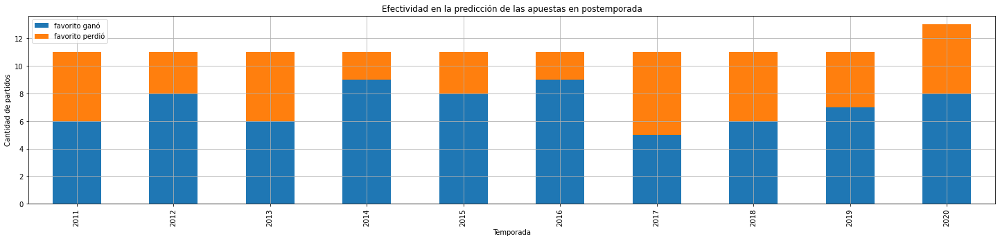

In [93]:
bets_accuracy_by_season["favorite_team_lost"] = bets_accuracy_by_season["total_games"] - bets_accuracy_by_season["favorite_team_won"]
bets_accuracy_by_season.columns = ["total partidos", "favorito ganó", "diferencia promedio puntos","porcentaje", "favorito perdió"]
bets_accuracy_by_season[["favorito ganó", "favorito perdió"]].plot.bar(stacked=True
    , figsize = (25,5)
    , grid = True
    , xlabel = "Temporada"
    , ylabel = "Cantidad de partidos"
    , title = "Efectividad en la predicción de las apuestas en postemporada")

plt.show()

Para los partidos de postemporada el promedio en que el favorito de las apuestas acierta baja a un **64%** pero nuevamente no hay mucha consistencia entre temporadas.

<a name="hard-calendar-wins"></a>
## Equipos con mas triunfos contra equipos con marca ganadora la temporada anterior

Un indicador interesante tiene que ver con la cantidad de partidos que gana un equipo contra equipos que tuvieron record ganador la temporada inmediatamente anterior. Normalmente este indicador define la dificultad del calendario de partidos de un equipo.

In [94]:
# get teams which play against teams with winner record previous season
home_teams = games[(games["game_type"] == "REG") 
    & (games["away_wins_losses_dif"] > 0)][["season", "home_team_name", "home_team_conf", "home_team_div", "result"]].copy()

home_teams.columns = ["season", "team_name", "conf", "division", "result"]

home_teams["win"] = home_teams.apply(lambda row: 1 if row["result"] > 0 else 0, axis=1)

home_teams.drop(["result"], axis=1, inplace=True)

away_teams = games[(games["game_type"] == "REG") 
    & (games["home_wins_losses_dif"] > 0)][["season", "away_team_name", "away_team_conf", "away_team_div", "result"]].copy()

away_teams.columns = ["season", "team_name", "conf", "division", "result"]

away_teams["win"] = away_teams.apply(lambda row: 1 if row["result"] < 0 else 0, axis=1)

away_teams.drop(["result"], axis=1, inplace=True)

# concat home and away dataframes
winner_teams = pd.concat([home_teams, away_teams])

# count games and sum wins grouping by team
winner_teams = winner_teams.groupby(by=["season", "team_name", "conf", "division"]).agg({"team_name" : "count", "win" : "sum"})
winner_teams.columns = ["games", "wins"]
winner_teams.reset_index(inplace=True)

# show best team by season
winner_teams_grouped = winner_teams.groupby(["season"]).apply(lambda x: x.sort_values(["wins"], ascending=False)).reset_index(drop=True)
display(winner_teams_grouped.groupby(["season"]).head(1))

,season,team_name,conf,division,games,wins
0,2011,Green Bay Packers,NFC,NFC North,8,7
32,2012,Minnesota Vikings,NFC,NFC North,7,6
64,2013,Carolina Panthers,NFC,NFC South,7,6
96,2014,Seattle Seahawks,NFC,NFC West,10,8
128,2015,Kansas City Chiefs,AFC,AFC West,11,8
160,2016,New England Patriots,AFC,AFC East,8,7
192,2017,Kansas City Chiefs,AFC,AFC West,11,7
224,2018,New Orleans Saints,NFC,NFC South,10,8
256,2019,Baltimore Ravens,AFC,AFC North,7,6
288,2020,Green Bay Packers,NFC,NFC North,7,6


Entre temporadas se destaca los records obtenidos por **Kansas City Chiefs** en las temporadas 2015 y 2017 donde enfrentaron 11 veces a equipos con marca ganadora y obtuvieron 8 y 7 victorias respectivamente.

<a name="hard-calendar-wins-chart"></a>
## Gráfica por division del último año

La siguiente gráfica muestra la dificultad del calendario que tuvieron cada uno de los equipos en la temporada 2020 por división

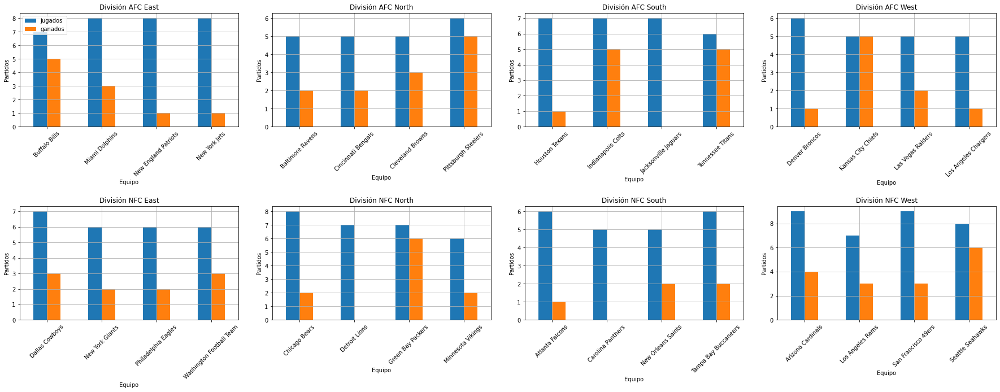

In [95]:
# unique divisions to plot
unique_divisions = winner_teams["division"].unique()
unique_divisions.sort()
unique_divisions = unique_divisions.reshape(2,4)

winner_teams = winner_teams[winner_teams["season"] == 2020].copy()

# plot team wins record against teams with winner record on the previous season
fig, axes = plt.subplots(2,4, figsize = (25,10))
is_first_plot = True
for row in range(2):
    for column in range(4):
        current_division = unique_divisions[row,column]
        teams_by_division = winner_teams[winner_teams["division"]==current_division][["team_name", "games", "wins"]]
        teams_by_division.set_index(["team_name"], inplace = True)
        teams_by_division.columns = ["jugados", "ganados"]
        teams_by_division.plot.bar(
            grid = True
            , xlabel = "Equipo"
            , ylabel = "Partidos"
            , title = f"División {current_division}"
            , ax = axes[row,column])
        # rotate x labels
        axes[row,column].tick_params(axis="x", rotation=45)
        if is_first_plot:
            axes[row,column].legend(loc='upper left')
            is_first_plot = False
        else:
            axes[row,column].legend().remove()

fig.tight_layout(pad=2.0)
plt.show()

Podemos observar que los calendarios mas dificiles en el año 2020 los tuvieron los equipos de las divisiones **AFC East** y **NFC West**

<a name="best-winner-record-by-conf"></a>
## Equipos con mejor marca ganadora de la decada por conferencia

A partir del dataset **standings** podemos conocer el top 5 de los equipos con mejor marca ganadora en la última decada

In [96]:
best_winner_records = standings.groupby(["conf", "division", "team_name"]).agg({"wins" : "sum", "losses" : "sum"})
best_winner_records.reset_index(inplace=True)

best_winner_records["winner_record"] = best_winner_records["wins"] - best_winner_records["losses"]

best_winner_records_grouped = best_winner_records.groupby(["conf"]).apply(lambda x: x.sort_values(["winner_record"], ascending=False)).reset_index(drop=True)
display(best_winner_records_grouped.groupby(["conf"]).head(5))

,conf,division,team_name,wins,losses,winner_record
0,AFC,AFC East,New England Patriots,118,42,76
1,AFC,AFC North,Pittsburgh Steelers,102,57,45
2,AFC,AFC West,Kansas City Chiefs,100,60,40
3,AFC,AFC North,Baltimore Ravens,97,63,34
4,AFC,AFC West,Denver Broncos,90,70,20
16,NFC,NFC North,Green Bay Packers,105,53,52
17,NFC,NFC West,Seattle Seahawks,105,54,51
18,NFC,NFC South,New Orleans Saints,101,59,42
19,NFC,NFC East,Dallas Cowboys,86,74,12
20,NFC,NFC North,Minnesota Vikings,82,76,6


Se demuestra la consistencia que han tenido los equipos **New England Patriots** y **Green Bay Packers** en las conferencias AFC y NFC respectivamente.

<a name="more-playoff-games"></a>
## Equipos con mas juegos de playoffs de la decada

A continuación se presentan agrupados por división los equipos que han participado en mas juegos de postemporada.

In [97]:
teams_with_playoff_games = standings[pd.notna(standings["seed"])].groupby(["conf", "division", "team_name"]).agg({"team_name" : "count"})
teams_with_playoff_games.columns = ["playoff_games"]
teams_with_playoff_games.reset_index(inplace=True)

# top by division
teams_with_playoff_games_grouped = teams_with_playoff_games.groupby(["division"]).apply(lambda x: x.sort_values(["playoff_games"], ascending=False)).reset_index(drop=True)
display(teams_with_playoff_games_grouped.groupby(["division"]).head(4))# Each division has 4 teams

,conf,division,team_name,playoff_games
0,AFC,AFC East,New England Patriots,9
1,AFC,AFC East,Buffalo Bills,3
2,AFC,AFC East,Miami Dolphins,1
3,AFC,AFC North,Baltimore Ravens,6
4,AFC,AFC North,Pittsburgh Steelers,6
5,AFC,AFC North,Cincinnati Bengals,5
6,AFC,AFC North,Cleveland Browns,1
7,AFC,AFC South,Houston Texans,6
8,AFC,AFC South,Indianapolis Colts,5
9,AFC,AFC South,Tennessee Titans,3


Para destacar en la división AFC East no se muestra el equipo **New York Yets** el cual no ha jugado un solo partido de playoff en las últimas 10 temporadas.

In [98]:
# top by conf
teams_with_playoff_games_grouped = teams_with_playoff_games.groupby(["conf"]).apply(lambda x: x.sort_values(["playoff_games"], ascending=False)).reset_index(drop=True)
display(teams_with_playoff_games_grouped.groupby(["conf"]).head(5))

,conf,division,team_name,playoff_games
0,AFC,AFC East,New England Patriots,9
1,AFC,AFC West,Kansas City Chiefs,7
2,AFC,AFC North,Baltimore Ravens,6
3,AFC,AFC North,Pittsburgh Steelers,6
4,AFC,AFC South,Houston Texans,6
15,NFC,NFC North,Green Bay Packers,8
16,NFC,NFC West,Seattle Seahawks,8
17,NFC,NFC South,New Orleans Saints,6
18,NFC,NFC East,Philadelphia Eagles,4
19,NFC,NFC North,Minnesota Vikings,4


Por conferencia se demuestra una vez mas el dominio que han tenido los equipos **New England Patriots** y **Green Bay Packers** en las últimas 10 temporadas.

<a name="best-offensive"></a>
## Mejor ofensiva de la década

A partir de **standings** se genera el top 5 de las mejores ofensivas de la decada calculando el promedio de puntos anotados por temporada

In [99]:
teams_points_mean = standings.groupby(["conf", "division", "team_name"]).agg({"scored" : np.mean, "allowed" : np.mean})
teams_points_mean.columns = ["points_scored_mean", "points_allowed_mean"]
teams_points_mean.reset_index(inplace=True)

# best offensive team
display(teams_points_mean.sort_values(by = 'points_scored_mean', ascending = False).head(5))

,conf,division,team_name,points_scored_mean,points_allowed_mean
26,NFC,NFC South,New Orleans Saints,459.2,380.8
2,AFC,AFC East,New England Patriots,452.8,308.8
22,NFC,NFC North,Green Bay Packers,427.7,364.8
31,NFC,NFC West,Seattle Seahawks,397.9,306.2
24,NFC,NFC South,Atlanta Falcons,397.8,381.1


<a name="worst-offensive"></a>
## Peor ofensiva de la década

A partir de **standings** se genera el top 5 de las peores ofensivas de la decada calculando el promedio de puntos anotados por temporada

In [100]:
# worst offensive team
display(teams_points_mean.sort_values(by = 'points_scored_mean', ascending = True).head(5))

,conf,division,team_name,points_scored_mean,points_allowed_mean
10,AFC,AFC South,Jacksonville Jaguars,295.6,395.5
6,AFC,AFC North,Cleveland Browns,300.5,391.6
3,AFC,AFC East,New York Jets,304.3,388.8
1,AFC,AFC East,Miami Dolphins,330.5,376.5
14,AFC,AFC West,Las Vegas Raiders,333.7,430.2


<a name="best-defensive"></a>
## Mejor defensiva de la década

Top 5 de las mejores defensivas de la decada calculando el promedio de puntos recibidos por temporada

In [101]:
# best defensive team
display(teams_points_mean.sort_values(by = 'points_allowed_mean', ascending = True).head(5))

,conf,division,team_name,points_scored_mean,points_allowed_mean
31,NFC,NFC West,Seattle Seahawks,397.9,306.2
2,AFC,AFC East,New England Patriots,452.8,308.8
4,AFC,AFC North,Baltimore Ravens,395.9,316.1
7,AFC,AFC North,Pittsburgh Steelers,383.7,320.8
13,AFC,AFC West,Kansas City Chiefs,390.4,337.7


<a name="worst-defensive"></a>
## Peor defensiva de la década

Top 5 de las peores defensivas de la decada calculando el promedio de puntos recibidos por temporada

In [102]:
# worst defensive team
display(teams_points_mean.sort_values(by = 'points_allowed_mean', ascending = False).head(5))

,conf,division,team_name,points_scored_mean,points_allowed_mean
14,AFC,AFC West,Las Vegas Raiders,333.7,430.2
27,NFC,NFC South,Tampa Bay Buccaneers,361.8,412.3
10,AFC,AFC South,Jacksonville Jaguars,295.6,395.5
19,NFC,NFC East,Washington Football Team,336.7,394.4
21,NFC,NFC North,Detroit Lions,371.8,391.8


<a name="dataset-play-by-play"></a>
## Dataset de jugadas por partido

En la misma colección **nflverse** encontré un repositorio de datos [nflfastR-data](https://github.com/nflverse/nflfastR-data) con información jugada a jugada de los partidos desde el año 1999.  Cada dataset pesa en promedio 100MB asi que a continuación se carga de manera dinámica los archivos correspondientes a las temporadas que estamos evaluando en esta actividad.

In [103]:
games_play_by_play = pd.DataFrame()

for i in seasons_to_evaluate:  
    # low_memory=False eliminates a warning for mixed datatypes
    print(f"Downloading {i} season data...")
    season_data = pd.read_csv('https://github.com/nflverse/nflfastR-data/blob/master/data/' \
                         'play_by_play_' + str(i) + '.csv.gz?raw=True',
                         compression='gzip', low_memory=False)

    # sort=True eliminates a warning and alphabetically sorts columns
    games_play_by_play = games_play_by_play.append(season_data, sort=True)

del season_data
# give each row a unique index
games_play_by_play.reset_index(drop=True, inplace=True)

In [104]:
# big dataset with plays for all seasons
display(games_play_by_play.sample(10))
games_play_by_play.info()

# select required columns and remove irrelevant
games_play_by_play = games_play_by_play[["game_id"
    , "season"
    , "posteam"
    , "defteam"
    , "game_half"
    , "qtr"
    , "down"
    , "play_type"
    , "yards_gained"
    , "field_goal_result"
    , "kick_distance"
    , "two_point_attempt"
    , "two_point_conv_result"
    , "incomplete_pass"
    , "interception"
    , "complete_pass"
    , "touchdown"
    , "pass_touchdown"
    , "passer_player_name"
    , "rusher_player_name"
    , "passing_yards"
    , "rushing_yards"
    , "pass"
    , "rush"
    ]]

,aborted_play,air_epa,air_wpa,air_yards,assist_tackle,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tackle_2_player_id,assist_tackle_2_player_name,...,xyac_median_yardage,xyac_success,yac_epa,yac_wpa,yardline_100,yards_after_catch,yards_gained,ydsnet,ydstogo,yrdln
337443,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,86.0,NaN,0.0,4.0,19,ATL 14
70625,0,1.566778,0.000000,16.0,0.0,NaN,NaN,NaN,NaN,NaN,...,2.0,1.000000,0.050352,0.000179,56.0,1.0,17.0,65.0,1,CHI 44
154176,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,49.0,NaN,1.0,82.0,10,PHI 49
456398,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,32.0,NaN,4.0,47.0,10,SF 32
438357,0,0.162929,-0.000563,6.0,0.0,NaN,NaN,NaN,NaN,NaN,...,2.0,0.989108,0.378182,0.004525,76.0,5.0,11.0,76.0,10,DAL 24
427022,0,NaN,NaN,NaN,1.0,00-0032627,J.Burgess,NYJ,NaN,NaN,...,NaN,NaN,NaN,NaN,19.0,NaN,0.0,39.0,10,NYJ 19
279845,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,56.0,NaN,8.0,33.0,1,NYJ 44
121674,0,2.336351,0.000000,28.0,0.0,NaN,NaN,NaN,NaN,NaN,...,5.0,1.000000,-3.197594,-0.016774,48.0,NaN,0.0,27.0,6,BAL 48
149033,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0,0,SF 48
110971,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,86.0,NaN,6.0,86.0,10,IND 14


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 483781 entries, 0 to 483780
Columns: 372 entries, aborted_play to yrdln
dtypes: float64(178), int64(37), object(157)
memory usage: 1.3+ GB


Luego de concatenar los 10 datasets en un único dataframe con 372 columnas y 483.781 filas (1.3 GB en memoria), se seleccionan únicamente las columnas que nos interesan analizar y cruzar con los datasets previamente cargados.

### Del nuevo dataset se remueven los registros donde la columna play_type es NaN debido a que de acuerdo a la exploración inicial del dataset, estos registros corresponden a las siguientes situaciones de juego que no son relevantes para en análisis: Inicio y fin del partido, inicio y fin de cada cuarto y tiempos fuera.

In [105]:
# Remove rows with nan in play type column
games_play_by_play.dropna(subset=["play_type"], inplace=True)

# showing sample data and info after remove rwow
display(games_play_by_play.sample(10))
display(games_play_by_play.info())

,game_id,season,posteam,defteam,game_half,qtr,down,play_type,yards_gained,field_goal_result,...,interception,complete_pass,touchdown,pass_touchdown,passer_player_name,rusher_player_name,passing_yards,rushing_yards,pass,rush
231598,2015_14_SEA_BAL,2015,BAL,SEA,Half1,2,1.0,pass,0.0,NaN,...,0.0,0.0,0.0,0.0,J.Clausen,NaN,NaN,NaN,1,0
444044,2020_04_ARI_CAR,2020,CAR,ARI,Half1,1,3.0,pass,17.0,NaN,...,0.0,1.0,0.0,0.0,T.Bridgewater,NaN,17.0,NaN,1,0
397193,2019_04_MIN_CHI,2019,CHI,MIN,Half2,3,4.0,punt,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0,0
204687,2015_04_MIN_DEN,2015,DEN,MIN,Half2,4,1.0,qb_kneel,-1.0,NaN,...,0.0,0.0,0.0,0.0,NaN,P.Manning,NaN,-1.0,0,0
247576,2016_02_NO_NYG,2016,NO,NYG,Half1,2,1.0,run,1.0,NaN,...,0.0,0.0,0.0,0.0,NaN,M.Ingram,NaN,1.0,0,1
379144,2018_15_TB_BAL,2018,TB,BAL,Half1,1,4.0,punt,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0,0
355264,2018_06_LA_DEN,2018,LA,DEN,Half2,4,3.0,run,14.0,NaN,...,0.0,0.0,0.0,0.0,NaN,T.Gurley,NaN,14.0,0,1
416840,2019_12_DAL_NE,2019,DAL,NE,Half1,1,2.0,no_play,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,1,0
400342,2019_05_JAX_CAR,2019,JAX,CAR,Half2,3,2.0,pass,0.0,NaN,...,0.0,0.0,0.0,0.0,G.Minshew,NaN,NaN,NaN,1,0
283883,2016_16_ATL_CAR,2016,ATL,CAR,Half2,3,3.0,no_play,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0,0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 462132 entries, 1 to 483779
Data columns (total 24 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   game_id                462132 non-null  object 
 1   season                 462132 non-null  int64  
 2   posteam                443130 non-null  object 
 3   defteam                443130 non-null  object 
 4   game_half              462132 non-null  object 
 5   qtr                    462132 non-null  int64  
 6   down                   401547 non-null  float64
 7   play_type              462132 non-null  object 
 8   yards_gained           461625 non-null  float64
 9   field_goal_result      10340 non-null   object 
 10  kick_distance          52065 non-null   float64
 11  two_point_attempt      461625 non-null  float64
 12  two_point_conv_result  952 non-null     object 
 13  incomplete_pass        461625 non-null  float64
 14  interception           461625 non-nu

None

In [106]:
# new columns to count made, missed field goals and two point conversions
games_play_by_play["field_goal_missed"] = games_play_by_play.apply(lambda row: 1 if row["field_goal_result"] == "missed" else 0, axis=1)
games_play_by_play["field_goal_made"] = games_play_by_play.apply(lambda row: 1 if row["field_goal_result"] == "made" else 0, axis=1)
games_play_by_play["two_point_convertion"] = games_play_by_play.apply(lambda row: 1 if row["two_point_conv_result"] == "success" else 0, axis=1)

<a name="two-points-convertion"></a>
## Análisis de conversiones de dos puntos

En los partidos de NFL, existe una jugada que se considera bastante arriesgada y que normalmente los equipos utilizan en situación de amplia desventaja para sumar mas puntos luego de cada touchdown. Dicha jugada es la conversión de 2 puntos y a continuación analizamos su utilización en el tiempo.

In [107]:
# two point attempts by season
two_point_attempts_by_season = games_play_by_play.groupby(by=["season"]).agg({"two_point_attempt" : "sum", "two_point_convertion" : "sum"})
two_point_attempts_by_season["convertion_percentage"] = round((two_point_attempts_by_season["two_point_convertion"] / two_point_attempts_by_season["two_point_attempt"]) * 100, 2)
display(two_point_attempts_by_season)
display(two_point_attempts_by_season.describe())

,two_point_attempt,two_point_convertion,convertion_percentage
season,,,
2011,53.0,24,45.28
2012,59.0,31,52.54
2013,73.0,36,49.32
2014,61.0,29,47.54
2015,102.0,50,49.02
2016,113.0,56,49.56
2017,91.0,37,40.66
2018,138.0,71,51.45
2019,119.0,56,47.06


,two_point_attempt,two_point_convertion,convertion_percentage
count,10.000000,10.00000,10.000000
mean,95.200000,45.60000,47.858000
std,33.027934,16.39241,3.388224
min,53.000000,24.00000,40.660000
25%,64.000000,32.25000,46.377500
50%,96.500000,43.50000,48.280000
75%,117.500000,56.00000,49.500000
max,143.000000,71.00000,52.540000


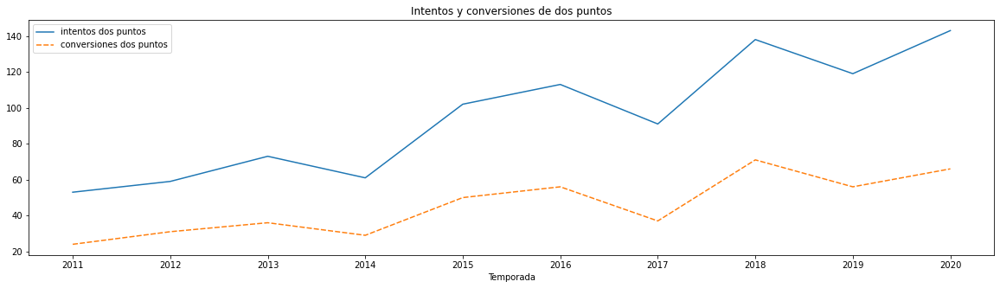

In [108]:
plt.figure(figsize=(20,5))

two_point_attempts_by_season.columns = ["intentos dos puntos", "conversiones dos puntos", "porcentaje conversion"]
chart = sns.lineplot(data = two_point_attempts_by_season[["intentos dos puntos", "conversiones dos puntos"]])
chart.set_title("Intentos y conversiones de dos puntos")
chart.set_xlabel("Temporada")
chart.set_xticks(seasons_to_evaluate)

plt.show()

Se puede percibir que cada año es mas comun que los equipos intenten mas la conversión de 2 puntos luego de anotar un touchdown. Lo que si se mantiene estable es el porcentaje de conversión o exito de dicho intento el cual es del **47.8%**

<a name="pass-rush-relationship"></a>
## Relación de pases y corridas por temporada

Un indicador que siempre me interesó conocer es la relación de jugadas de pase vs las jugadas de corrida

In [109]:
# count pass and rush plays grouped by season
total_play_types_by_season = games_play_by_play.groupby(by=["season"]).agg({"pass" : "sum", "rush" : "sum"})
display(total_play_types_by_season)

,pass,rush
season,,
2011,21202,13785
2012,21531,13849
2013,22017,13608
2014,21874,13458
2015,22407,13262
2016,22223,13167
2017,21547,13507
2018,21857,13020
2019,22053,13143


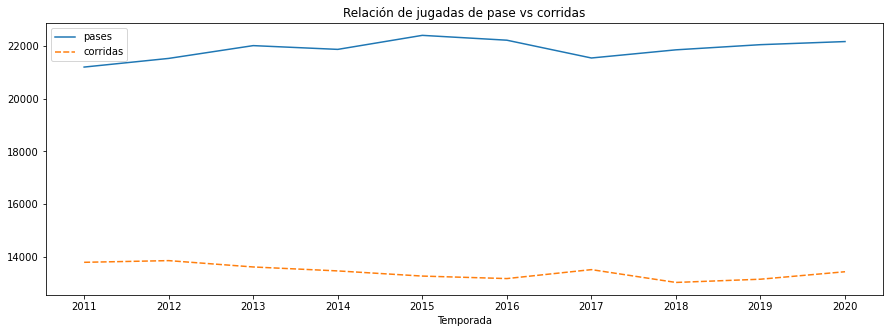

In [110]:
plt.figure(figsize=(15,5))
total_play_types_by_season.columns = ["pases", "corridas"]
chart = sns.lineplot(data = total_play_types_by_season[["pases", "corridas"]])
chart.set_title("Relación de jugadas de pase vs corridas")
chart.set_xlabel("Temporada")
chart.set_xticks(seasons_to_evaluate)

plt.show()

Aparentemente existe un leve aumento en la cantidad de jugadas de pase año a año el cual contrasta con una leve reducción en las jugadas de corrida. Pero en general se puede decir que la proporcion ha sido estable en las últimas 10 temporadas.

<a name="qb-best-index"></a>
## QB con mejor indice de touchdowns/intersecciones por temporada

Siempre se habla de la importancia de la posición de QB en la NFL y una forma de medir su eficacia es establecer una relación entre la cantidad de touchdowns y la cantidad de intersecciones por temporada.  Una relación o índice de 4 o superior define a un QB de elite en la NFL.

In [111]:
total_plays_by_qb = games_play_by_play.groupby(by=["season", "passer_player_name"]).agg(
    {"pass_touchdown" : "sum" 
    , "interception" : "sum" })

total_plays_by_qb.reset_index(inplace=True)

# replace with 1 when interceptions number is 0
total_plays_by_qb.loc[total_plays_by_qb["interception"]==0, "interception"] = 1

total_plays_by_qb["touchdown_interception_index"]  = total_plays_by_qb["pass_touchdown"] / total_plays_by_qb["interception"]

# remove QB with less than 10 touchdowns by season
total_plays_by_qb_grouped = total_plays_by_qb[total_plays_by_qb["pass_touchdown"]>=10].groupby(["season"]).apply(lambda x: x.sort_values(["touchdown_interception_index"]
    , ascending=False)).reset_index(drop=True)

display(total_plays_by_qb_grouped.groupby(["season"]).head(1))

,season,passer_player_name,pass_touchdown,interception,touchdown_interception_index
0,2011,A.Rodgers,47.0,7.0,6.714286
30,2012,A.Rodgers,42.0,9.0,4.666667
61,2013,N.Foles,29.0,2.0,14.500000
93,2014,A.Rodgers,42.0,7.0,6.000000
126,2015,T.Brady,39.0,9.0,4.333333
157,2016,T.Brady,35.0,5.0,7.000000
186,2017,A.Smith,28.0,5.0,5.600000
216,2018,A.Rodgers,25.0,2.0,12.500000
250,2019,R.Wilson,33.0,5.0,6.600000
281,2020,A.Rodgers,53.0,6.0,8.833333


Se destaca claramente el QB **A. Rodgers** el cual ha liderado el índice en la última decada.  Tambien vale la pena mencionar el indice de **14.5** obtenido por **N.Foles** en la temporada 2013.

<a name="correlations"></a>
## Análisis de correlaciones

A partir del dataset de jugadas agrupadas por partido y sumando las siguientes variables, se procede a realizar un análisis de correlaciones para determinar si las condiciones climaticas (viento y temperatura) afectan el juego de pase o los intentos de gol de campo:

- Pases
- Corridas
- Pases incompletos
- Pases interceptados
- Pases completos
- Touchdowns
- Touchdowns por pase
- Goles de campo fallados
- Goles de campo completados

Para calcular las correlaciones se procede a combinar el dataframe de games con un dataframe de jugadas agrupadas por partido

In [112]:
# calculate total metrics by game
total_play_types_by_game = games_play_by_play.groupby(by=["game_id"]).agg(
    {"pass" : "sum"
    , "rush" : "sum" 
    , "incomplete_pass" : "sum" 
    , "interception" : "sum" 
    , "complete_pass" : "sum" 
    , "touchdown" : "sum" 
    , "pass_touchdown" : "sum" 
    , "field_goal_missed" : "sum"
    , "field_goal_made" : "sum"})

total_play_types_by_game.reset_index(inplace=True)
total_play_types_by_game.set_index("game_id", inplace=True)

# merge total plays with games dataset
games = games.merge(total_play_types_by_game, left_index=True, right_index=True, how="inner")

El dataframe de games contiene valores NaN en las columnas de viento y temperatura cuando el juego se realiza en estadio cubierto o domo. En este caso reemplazamos dichos valores con una temperatura de 72F que equivalen a mas o menos 22C (temperatura controlada) y viento 0.

Se genera un nuevo dataframe luego de la combinación entre partidos y jugadas por partido con las siguientes variables con posibilidad de correlación:

- Tipo de estadio: Bajo techo o descubierto
- Temperatura
- Viento
- Cantidad de pases
- Cantidad de corridas
- Pases incompletos
- Goles de campo fallidos

In [113]:
# fill missing temp and wind values when the stadium is a dome or has closed roof
games["temp"] = games["temp"].fillna(72) # About 22 celsius
games["wind"] = games["wind"].fillna(0) # No wind

# select games columns for correlation analysis 
games_for_correlation = games[["roof"
, "temp"
, "wind"
, "pass"
, "rush"
, "incomplete_pass"
, "field_goal_missed"
]].copy()

display(games_for_correlation.corr().style.background_gradient(cmap=plt.get_cmap('RdYlGn'), axis=1))

,temp,wind,pass,rush,incomplete_pass,field_goal_missed
temp,1.000000,-0.295033,0.068852,-0.087429,-0.078429,0.020230
wind,-0.295033,1.000000,-0.055385,0.095717,0.070709,0.043975
pass,0.068852,-0.055385,1.000000,-0.518127,0.643188,0.049425
rush,-0.087429,0.095717,-0.518127,1.000000,-0.103593,0.058140
incomplete_pass,-0.078429,0.070709,0.643188,-0.103593,1.000000,0.074339
field_goal_missed,0.020230,0.043975,0.049425,0.058140,0.074339,1.000000


/Users/agilecode/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/agilecode/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/agilecode/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/agilecode/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/agilecode/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/agilecode/opt/anaconda3/lib/python3.8/site-packages/seabor

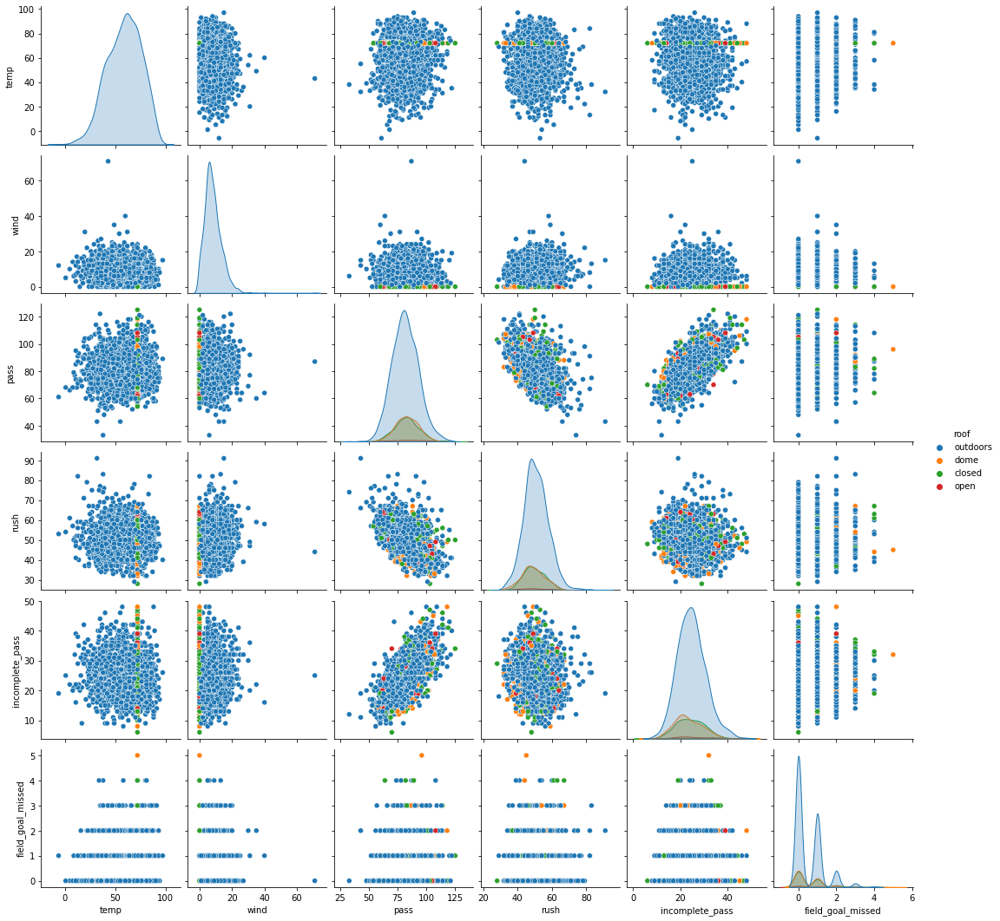

In [114]:
# plot pair plot to identify correlations
sns.pairplot(games_for_correlation, hue="roof")
plt.show()

En general no se perciben correlaciones relevantes entre el viento y la temperatura con el tipo de jugada (pase o corrida), los pases incompletos o los goles de campo fallidos. Aunque vale la pena mencionar de la tabla de correlaciones presentada previamente que:

- Si se presenta mucho viento, la cantidad de jugadas de pase se reduce levemente, aumentando las jugadas de corrida en consecuencia
- Si se presenta mucho viento, hay mayor cantidad de pases incompletos
- Si se presenta baja temperatura, existe una preferencia por las jugadas de corrida y se reducen los pases incompletos en consecuencia.